# Mejoramiento de Imágenes

Instalo e importo las librerías a utilizar:

In [1]:
import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt
import cv2
from scipy import signal
from scipy.stats import norm
import math

Monto el Drive para acceder a las imágenes

[Link a las imágenes](https://drive.google.com/drive/folders/1Nh5KKSVv1FAz8CMWOFKFU6M1D3vbnC91?usp=sharing) que se van a utilizar

In [2]:
path = 'C:/Users/Juan Bautista/.vscode/PSIB/Mejoramiento/Imagenes Mejoramiento'

## Transformaciones de Intensidad (Parte 1)

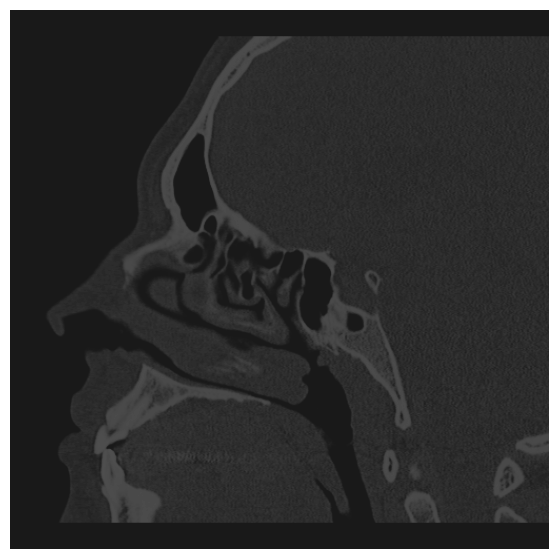

In [3]:
img1 = cv2.imread(f'{path}/img25.png',0)

plt.figure(figsize=(7,7))
plt.imshow(img1, cmap="gray",vmin=0, vmax=255)
plt.axis(False)
plt.show()

In [4]:
print(img1.dtype)

uint8


<font color="blue">¿Cómo podemos visualizar el histograma?</font>

In [5]:
img1

array([[25, 25, 25, ..., 25, 25, 25],
       [25, 25, 25, ..., 25, 25, 25],
       [25, 25, 25, ..., 25, 25, 25],
       ...,
       [25, 25, 25, ..., 25, 25, 25],
       [25, 25, 25, ..., 25, 25, 25],
       [25, 25, 25, ..., 25, 25, 25]], dtype=uint8)

In [6]:
512*512

262144

In [7]:
np.ravel(img1).shape

(262144,)

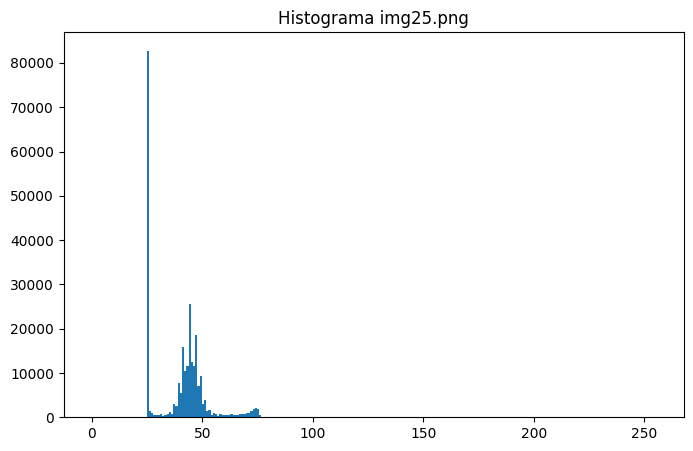

In [8]:
plt.figure(figsize=(8,5))
plt.hist(np.ravel(img1), bins=256, range=(0,255))
#la funcion hist recibe un vector de una dimension, tengo que usar ravel para poder usarla
plt.title('Histograma img25.png')
#plt.xlim(25, 80)
plt.show()

<font color="blue">¿Qué pasa si le sumamos una constante a la imagen?</font>

In [9]:
print(np.max(img1))
img2 = img1+80

78


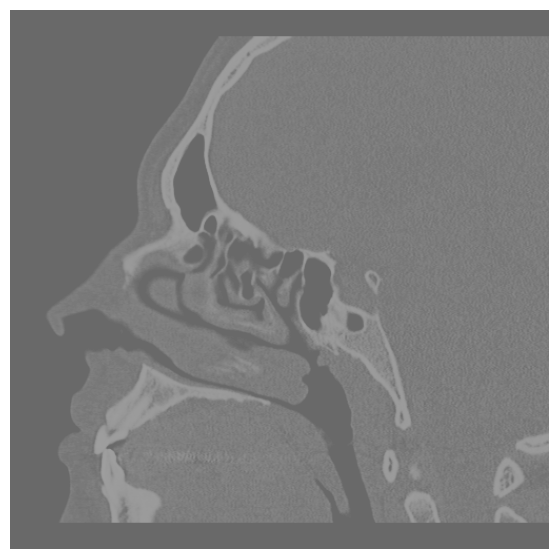

In [10]:
plt.figure(figsize=(7,7))
plt.imshow(img2, cmap="gray",vmin=0, vmax=255)
plt.axis(False)
plt.show()

<font color="blue">¿Cómo puedo cambiar el contraste de la imagen1?</font>

Si no especificamos `vmin` y `vmax` en `imshow()` toma como máximo brillo el valor máximo de la imagen.

In [11]:
print(np.min(img1))
print(np.max(img1))

25
78


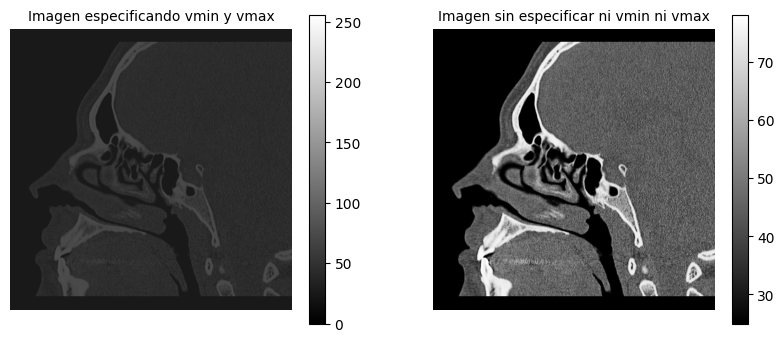

In [12]:
fig, ax = plt.subplots(1,2, figsize=(10,20))

im0=ax[0].imshow(img1, vmin=0, vmax=255, cmap="gray")
ax[0].set_title('Imagen especificando vmin y vmax',fontsize=10)
ax[0].axis(False)
cbar = fig.colorbar(im0, ax=ax[0],shrink=0.2)

im1=ax[1].imshow(img1, cmap="gray")
ax[1].set_title('Imagen sin especificar ni vmin ni vmax',fontsize=10)
ax[1].axis(False)
cbar = fig.colorbar(im1, ax=ax[1],shrink=0.2)

plt.show()

### Ejercicios

1. Crear una función para construir el histograma de una imágen

In [13]:
def histograma(imagen,gray,rgb):
    if gray:
        cuentas = np.zeros(256)
        for fila in imagen:
            for pixel in fila:
                cuentas[int(pixel)] +=1

        return cuentas
    elif rgb:
        r = np.zeros(256, dtype=int)
        g = np.zeros(256, dtype=int)
        b = np.zeros(256, dtype=int)
        for fila in imagen:
            for pixel in fila:
                r[int(pixel[0])] += 1  
                g[int(pixel[1])] += 1  
                b[int(pixel[2])] += 1 
        return r, g, b

Pruebo mi funcion para una imagen en escala de grices

In [ ]:
bits = np.arange(0,256)
plt.bar(bits,histograma(img1,True,False),color='gray')
plt.show()

: 

Ahora para RGB

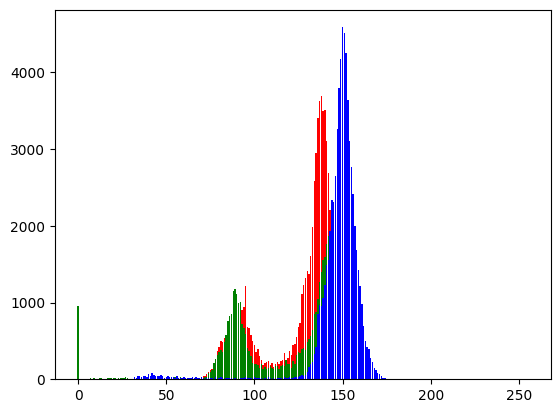

In [15]:
path2 = 'C:/Users/Juan Bautista/.vscode/PSIB/Mejoramiento/img24.png'
img2_1 = cv2.imread(path2, 1)

bit = np.arange(0,256)
r,g,b = histograma(img2_1,False,True)
plt.bar(bit,r,color = 'r')
plt.bar(bit,g,color='g')
plt.bar(bit,b,color='b')
plt.show()

## Tipos de ruido

In [16]:
img3 = cv2.imread(f'{path}/img1.jpg',0)
img3_ruido_gauss = cv2.imread(f'{path}/img1_ruido_gauss.png',0)
img3_ruido_SyP = cv2.imread(f'{path}/img1_ruido_SyP.png',0)

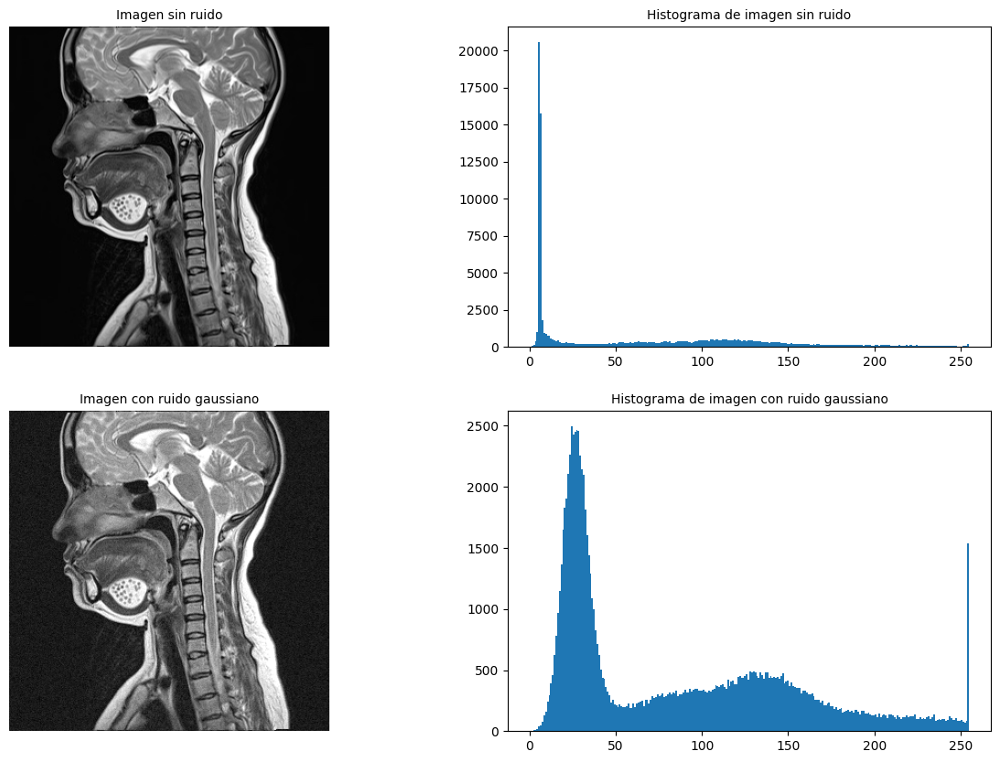

In [17]:
fig,ax = plt.subplots(2,2,figsize=(15,10))

ax[0,0].imshow(img3, cmap="gray",vmin=0,vmax=255)
ax[0,0].set_title("Imagen sin ruido",fontsize=10)
ax[0,0].axis(False)

ax[1,0].imshow(img3_ruido_gauss, cmap='gray',vmin=0,vmax=255)
ax[1,0].set_title("Imagen con ruido gaussiano",fontsize=10)
ax[1,0].axis(False)

ax[0,1].hist(np.ravel(img3), bins=256, range=(0,255))
ax[0,1].set_title("Histograma de imagen sin ruido",fontsize=10)

ax[1,1].hist(np.ravel(img3_ruido_gauss), bins=256, range=(0,255))
ax[1,1].set_title("Histograma de imagen con ruido gaussiano",fontsize=10)

plt.show()

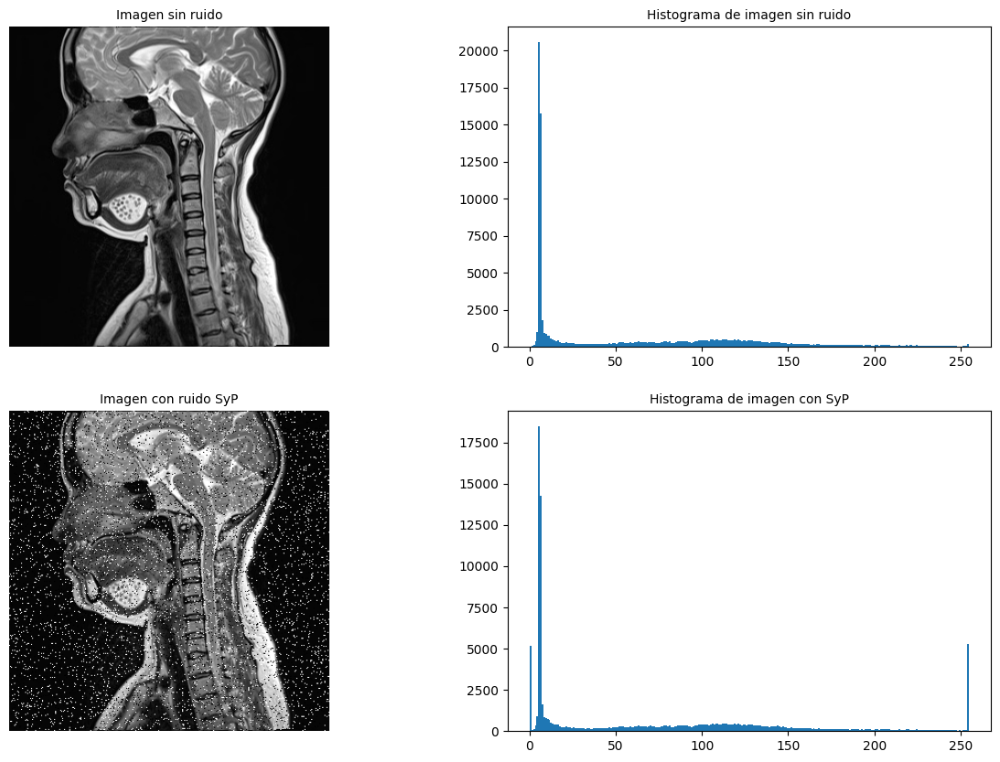

In [18]:
fig,ax = plt.subplots(2,2,figsize=(15,10))

ax[0,0].imshow(img3, cmap="gray",vmin=0,vmax=255)
ax[0,0].set_title("Imagen sin ruido",fontsize=10)
ax[0,0].axis(False)

ax[1,0].imshow(img3_ruido_SyP, cmap='gray',vmin=0,vmax=255)
ax[1,0].set_title("Imagen con ruido SyP",fontsize=10)
ax[1,0].axis(False)

ax[0,1].hist(np.ravel(img3), bins=256, range=(0,255))
ax[0,1].set_title("Histograma de imagen sin ruido",fontsize=10)

ax[1,1].hist(np.ravel(img3_ruido_SyP), bins=256, range=(0,255))
ax[1,1].set_title("Histograma de imagen con SyP",fontsize=10)

plt.show()

<font color="blue">¿Cómo me doy cuenta que tipo de ruido es?</font>

Principalmente analizando el fondo de la imagen

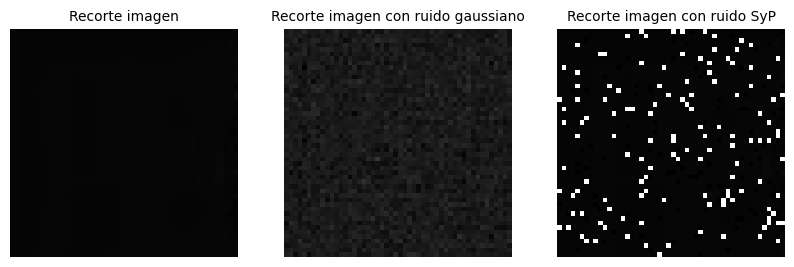

In [19]:
recorte_SyP = img3_ruido_SyP[:50,:50]
recorte_gauss = img3_ruido_gauss[:50,:50]
recorte = img3[:50,:50]

fig,ax = plt.subplots(1,3,figsize=(10,25))
ax[0].imshow(recorte, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Recorte imagen",fontsize=10)
ax[1].imshow(recorte_gauss, cmap="gray",vmin=0,vmax=255)
ax[1].set_title("Recorte imagen con ruido gaussiano",fontsize=10)
ax[2].imshow(recorte_SyP, cmap='gray',vmin=0,vmax=255)
ax[2].set_title("Recorte imagen con ruido SyP",fontsize=10)
ax[0].axis(False)
ax[1].axis(False)
ax[2].axis(False)
plt.show()

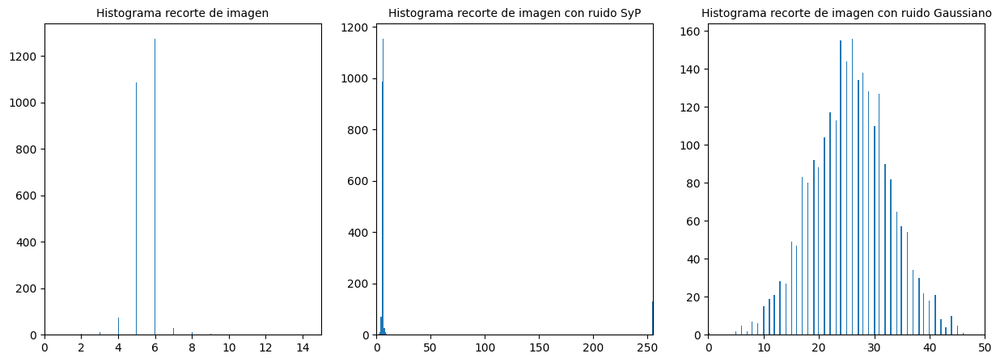

In [20]:
plt.figure(figsize=(15,5))
plt.subplot(131)
plt.hist(np.ravel(recorte),bins=256)
plt.title('Histograma recorte de imagen',fontsize=10)
plt.xlim(0,15)
plt.subplot(132)
plt.hist(np.ravel(recorte_SyP),bins=256)
plt.title('Histograma recorte de imagen con ruido SyP',fontsize=10)
plt.xlim(0,255)
plt.subplot(133)
plt.hist(np.ravel(recorte_gauss),bins=256)
plt.title('Histograma recorte de imagen con ruido Gaussiano',fontsize=10)
plt.xlim(0,50)
plt.show()

<font color="blue">¿Cómo podemos filtrar estos ruidos?</font>

## Filtros

### Convolución

![Convolución](https://textarchive.ru/images/1371/2741313/m229d2f93.png)

<font color="blue">¿Qué kernels tengo que utilizar para eliminar estos ruidos?</font>

*  **Ruido Gaussiano:** Filtro Promediador o Filtro Gaussiano
*   **Ruido SyP:** Filtro de Mediana



In [21]:
kernel_FP = 1/25 * np.array(([1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1])) # Ejemplo kernel promediador
kernel_FP

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]])

<font color="blue">¿Cómo lo puedo generalizar para utilizar kernel 3x3 o 7x7?</font>

In [22]:
def GaussianKernel2D(nfil, ncol, sigma):
    """
    Generate a 2D Gaussian kernel.

    Parameters:
    - nfil: Number of rows (height) of the kernel.
    - ncol: Number of columns (width) of the kernel.
    - sigma: Standard deviation of the Gaussian distribution.

    Returns:
    - A 2D Gaussian kernel of size (nfil, ncol).
    """
    kernel_1d_row = cv2.getGaussianKernel(ncol, sigma)
    kernel_1d_col = cv2.getGaussianKernel(nfil, sigma)
    kernel_1d_col = np.transpose(kernel_1d_col)
    gaussian_kernel_2d = np.dot(kernel_1d_row, kernel_1d_col)
    return gaussian_kernel_2d

In [23]:
kernel_FG = GaussianKernel2D(3,3,2)
kernel_FG #kernel Gaussiano

array([[0.10186806, 0.11543164, 0.10186806],
       [0.11543164, 0.13080118, 0.11543164],
       [0.10186806, 0.11543164, 0.10186806]])

Aplicamos el filtro a la imagen que posee ruido Gaussiano

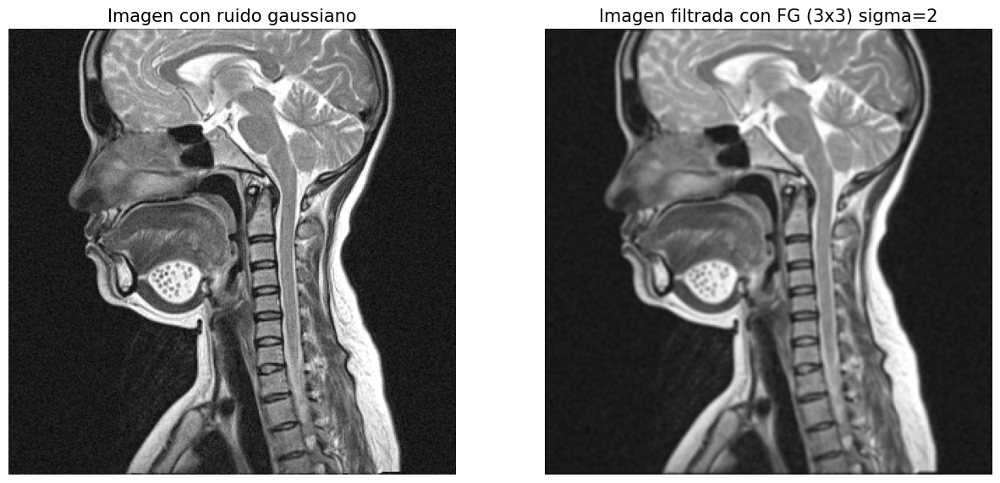

In [24]:
#Usamos librería scipy para hacer convolución
imagen_Gauss_FiltradaScipy = signal.convolve2d(img3_ruido_gauss, kernel_FG, mode='same')
#le paso la imagen, el ernel y hace la convolucion, el modo same es para que la imagen de salida tenga la misma dimension que la de entrada
fig,ax = plt.subplots(1,2,figsize=(15,20))

ax[0].imshow(img3_ruido_gauss, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen con ruido gaussiano",fontsize=15)
ax[0].axis(False)

ax[1].imshow(imagen_Gauss_FiltradaScipy, cmap='gray',vmin=0,vmax=255)
ax[1].set_title("Imagen filtrada con FG (3x3) sigma=2",fontsize=15)
ax[1].axis(False)
plt.show()

Ahora filtramos con el kernel_FG usando la librería cv2:

In [25]:
kernel_FG

array([[0.10186806, 0.11543164, 0.10186806],
       [0.11543164, 0.13080118, 0.11543164],
       [0.10186806, 0.11543164, 0.10186806]])



```
resulting_image = cv2.filter2D(src, ddepth, kernel)
```



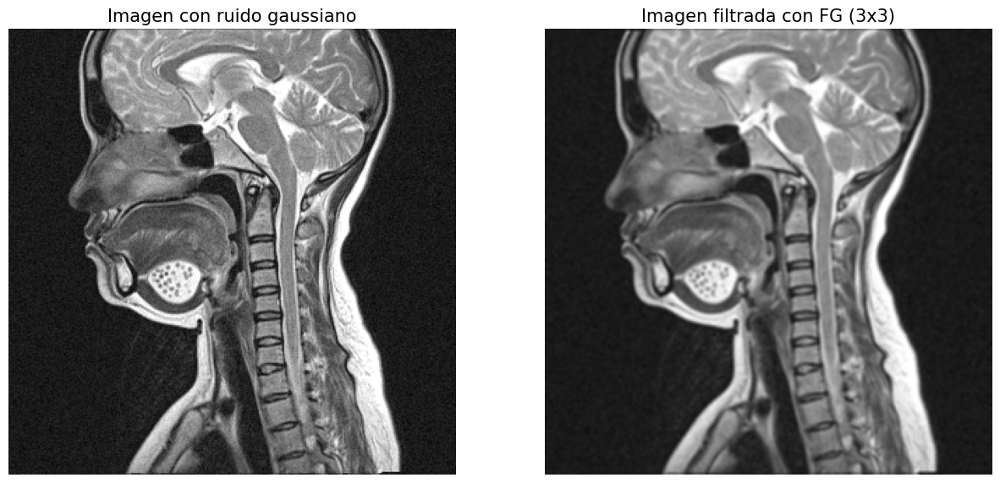

In [26]:
imagen_Gauss_FiltradaCv2 =cv2.filter2D(img3_ruido_gauss,ddepth=-1,kernel=kernel_FG)
#ddepth=-1 indica que quiero la misma profundidad que la imagen original
# si le paso una en gris que me la devuelva en la misma escala

fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(img3_ruido_gauss, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen con ruido gaussiano",fontsize=15)
ax[0].axis(False)

ax[1].imshow(imagen_Gauss_FiltradaCv2, cmap='gray',vmin=0,vmax=255)
ax[1].set_title("Imagen filtrada con FG (3x3)",fontsize=15)
ax[1].axis(False)
plt.show()


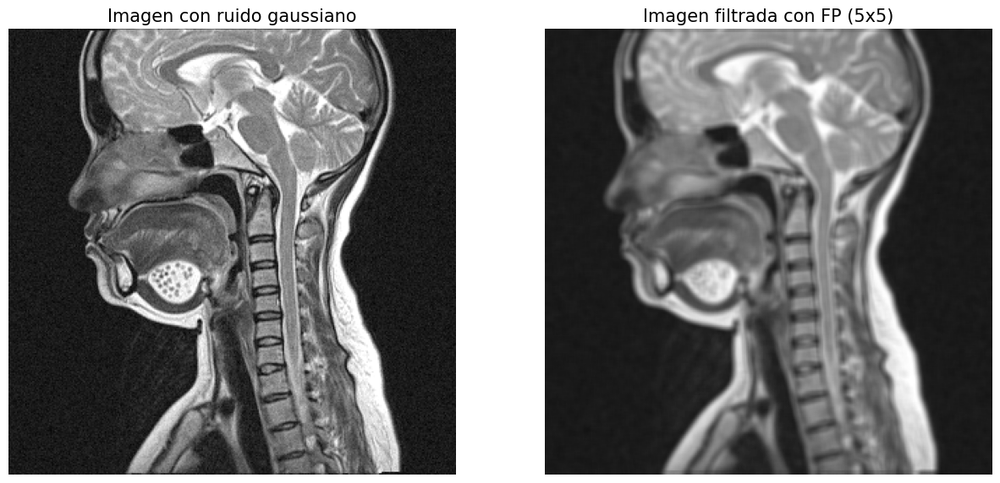

In [27]:
imagen_Gauss_Filtrada_FP =cv2.filter2D(img3_ruido_gauss,-1,kernel_FP)

fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(img3_ruido_gauss, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen con ruido gaussiano",fontsize=15)
ax[0].axis(False)
ax[1].imshow(imagen_Gauss_Filtrada_FP, cmap='gray',vmin=0,vmax=255)
ax[1].set_title("Imagen filtrada con FP (5x5)",fontsize=15)
ax[1].axis(False)
plt.show()


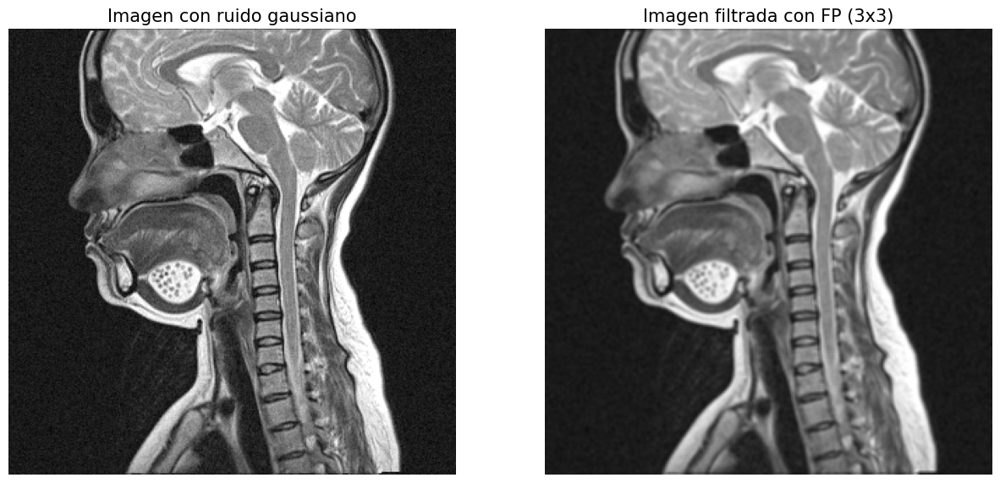

In [28]:
kernel_FP_3x3 = 1/9 * np.array(([1,1,1],[1,1,1],[1,1,1])) # Ejemplo kernel promediador

imagen_Gauss_Filtrada_FP =cv2.filter2D(img3_ruido_gauss,-1,kernel_FP_3x3)

fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(img3_ruido_gauss, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen con ruido gaussiano",fontsize=15)
ax[0].axis(False)
ax[1].imshow(imagen_Gauss_Filtrada_FP, cmap='gray',vmin=0,vmax=255)
ax[1].set_title("Imagen filtrada con FP (3x3)",fontsize=15)
ax[1].axis(False)
plt.show()

Aplicamos el filtro a la imagen que posee ruido Sal y Pimienta

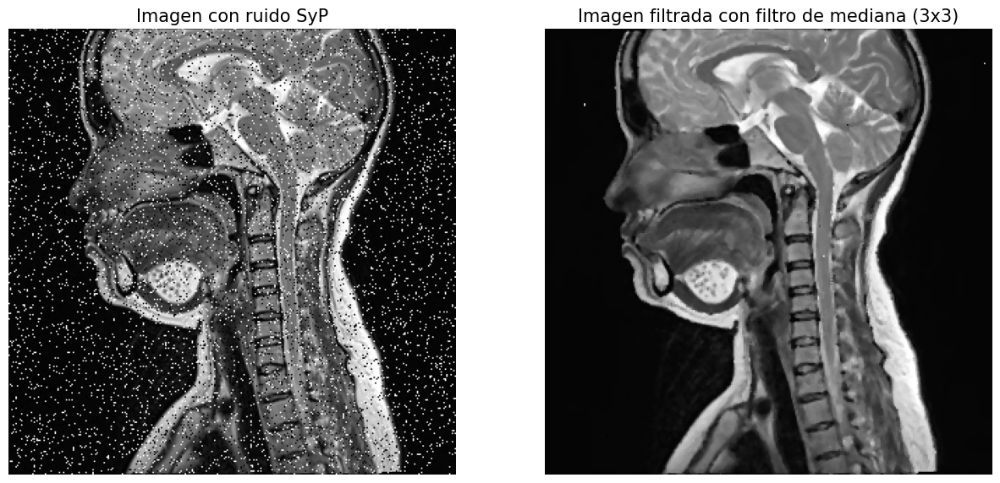

In [29]:
n=3 #Máscara 3x3
imagen_SyP_filtrada =cv2.medianBlur(img3_ruido_SyP,n)

fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(img3_ruido_SyP, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen con ruido SyP",fontsize=15)
ax[0].axis(False)
ax[1].imshow(imagen_SyP_filtrada, cmap='gray',vmin=0,vmax=255)
ax[1].set_title("Imagen filtrada con filtro de mediana (3x3)",fontsize=15)
ax[1].axis(False)
plt.show()


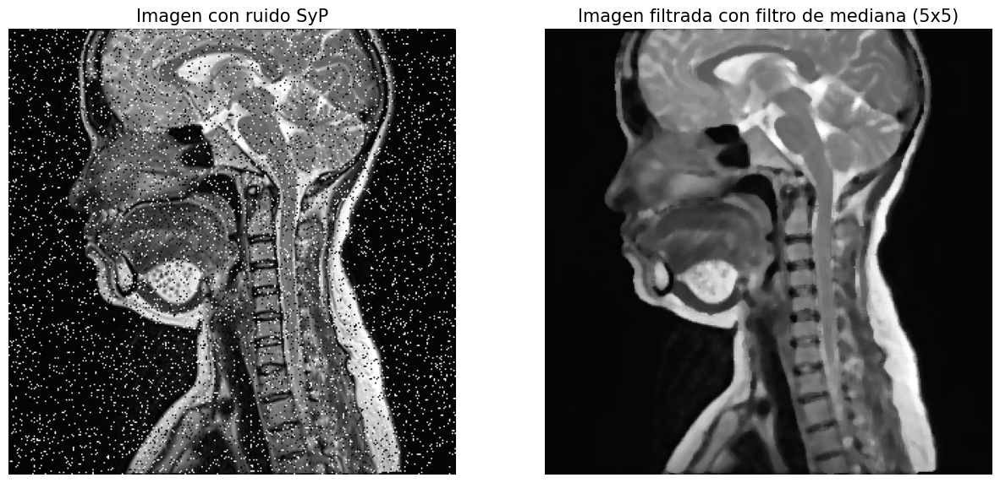

In [30]:
n=5 #Máscara 5x5
imagen_SyP_filtrada =cv2.medianBlur(img3_ruido_SyP,n)

fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(img3_ruido_SyP, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen con ruido SyP",fontsize=15)
ax[0].axis(False)
ax[1].imshow(imagen_SyP_filtrada, cmap='gray',vmin=0,vmax=255)
ax[1].set_title("Imagen filtrada con filtro de mediana (5x5)",fontsize=15)
ax[1].axis(False)
plt.show()


<font color="blue">¿Qué pasa si filtro imagen con ruido Gaussiano con Filtro de Mediana?</font>

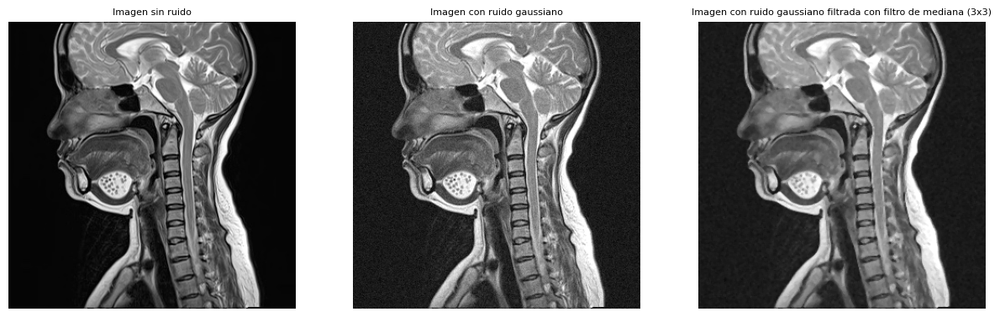

In [31]:
imagen_Gauss_Filtrada_FM =cv2.medianBlur(img3_ruido_gauss,3)

fig,ax = plt.subplots(1,3,figsize=(15,20))
ax[0].imshow(img3, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen sin ruido",fontsize=8)
ax[0].axis(False)

ax[1].imshow(img3_ruido_gauss, cmap="gray",vmin=0,vmax=255)
ax[1].set_title("Imagen con ruido gaussiano",fontsize=8)
ax[1].axis(False)

ax[2].imshow(imagen_Gauss_Filtrada_FM, cmap='gray',vmin=0,vmax=255)
ax[2].set_title("Imagen con ruido gaussiano filtrada con filtro de mediana (3x3)",fontsize=8)
ax[2].axis(False)
plt.show()


<font color="blue">¿Qué pasa si filtro imagen con ruido SyP con Filtro de Gauss?</font>

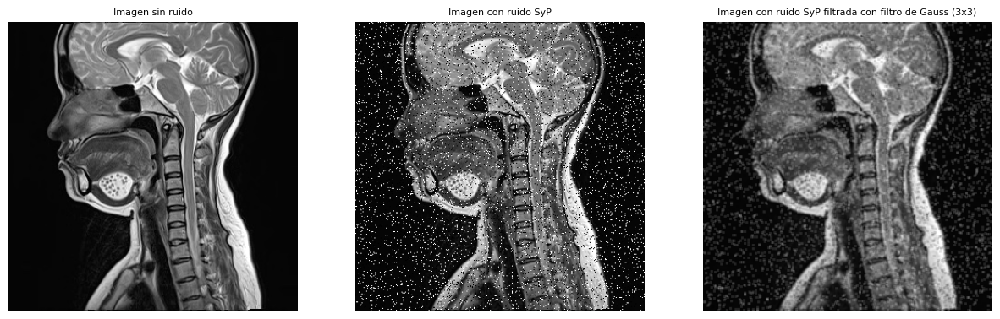

In [32]:
imagen_SyP_FiltradaCv2 =cv2.filter2D(img3_ruido_SyP,ddepth=-1,kernel=kernel_FG)
#ddepth=-1 indica que quiero la misma profundidad que la imagen original

fig,ax = plt.subplots(1,3,figsize=(15,20))
ax[0].imshow(img3, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen sin ruido",fontsize=8)
ax[0].axis(False)

ax[1].imshow(img3_ruido_SyP, cmap="gray",vmin=0,vmax=255)
ax[1].set_title("Imagen con ruido SyP",fontsize=8)
ax[1].axis(False)

ax[2].imshow(imagen_SyP_FiltradaCv2, cmap='gray',vmin=0,vmax=255)
ax[2].set_title("Imagen con ruido SyP filtrada con filtro de Gauss (3x3)",fontsize=8)
ax[2].axis(False)
plt.show()


### Ejercicios

1. Crear una función para construir el algoritmo de zero-padding

primero voy a crear una funcion para hacer la convolucion y para el zero padding impongo condiciones para que no sume esos valores que es lo mismo que multiplicarlos por 0

In [33]:
def convolucion(imagen,kernel):
    K_Dim = len(kernel)
    K_centro  = K_Dim//2
    altura = len(imagen)
    ancho = len(imagen[0])
    resultado = np.zeros((altura,ancho))
    for fila in range(altura):
        for columna in range(ancho):
            Suma = 0
            for i in range(K_Dim):
                for j in range(K_Dim):
                    f = fila + i - K_centro
                    c = columna + j - K_centro
                    if 0 <= f < altura and 0 <= c < ancho:
                        Suma += imagen[f][c]*kernel[i][j]
            if Suma > 256:
                resultado[fila][columna] = 255
            if Suma < 0:
                resultado[fila][columna] = 0
            if 0 <= Suma < 256:
                resultado[fila][columna] = Suma
    return resultado

2. Crear una función para construir el algoritmo de convolución para aplicar filtro gaussiano y promediador



In [34]:
def kernel_gauss(dimension, media, var):
    kernel = np.zeros((dimension, dimension), dtype=np.float32)
    for i in range(dimension):
        for j in range(dimension):
            x = i - dimension // 2
            y = j - dimension // 2
            kernel[i, j] = (1 / (2 * np.pi * var))* np.exp(-((x - media) ** 2 + (y - media) ** 2) / (2 * var))
    kernel /= np.sum(kernel)
    return kernel

gauss_kernel = kernel_gauss(3,0,1)
print(gauss_kernel)


[[0.07511362 0.12384141 0.07511362]
 [0.12384141 0.20417996 0.12384141]
 [0.07511362 0.12384141 0.07511362]]


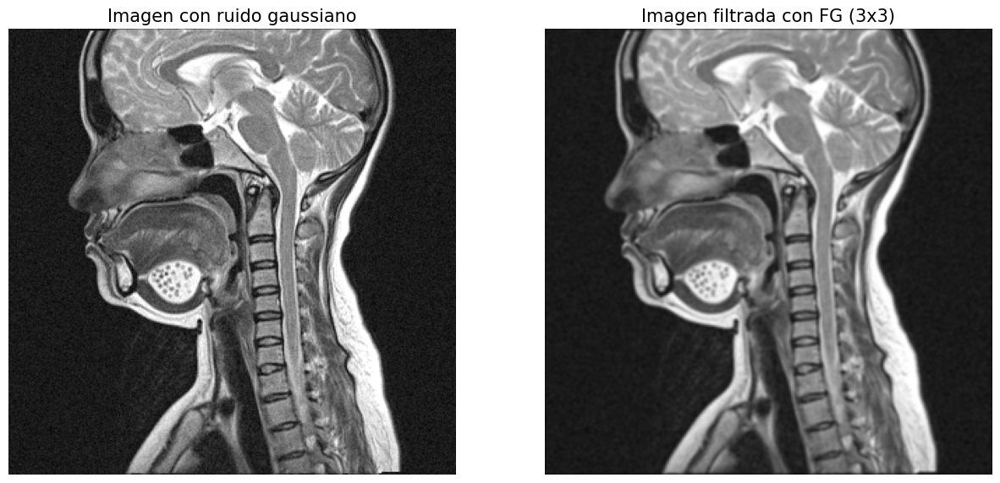

In [35]:
n=3
imagen_Gauss_FiltradaCv2 = convolucion(img3_ruido_gauss,kernel_gauss(n,0,1))
#ddepth=-1 indica que quiero la misma profundidad que la imagen original
# si le paso una en gris que me la devuelva en la misma escala

fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(img3_ruido_gauss, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen con ruido gaussiano",fontsize=15)
ax[0].axis(False)

ax[1].imshow(imagen_Gauss_FiltradaCv2, cmap='gray',vmin=0,vmax=255)
ax[1].set_title("Imagen filtrada con FG (3x3)",fontsize=15)
ax[1].axis(False)
plt.show()

In [36]:
def Kernel_promediador(dimension):
    return (np.ones((dimension,dimension)))/(dimension**2)

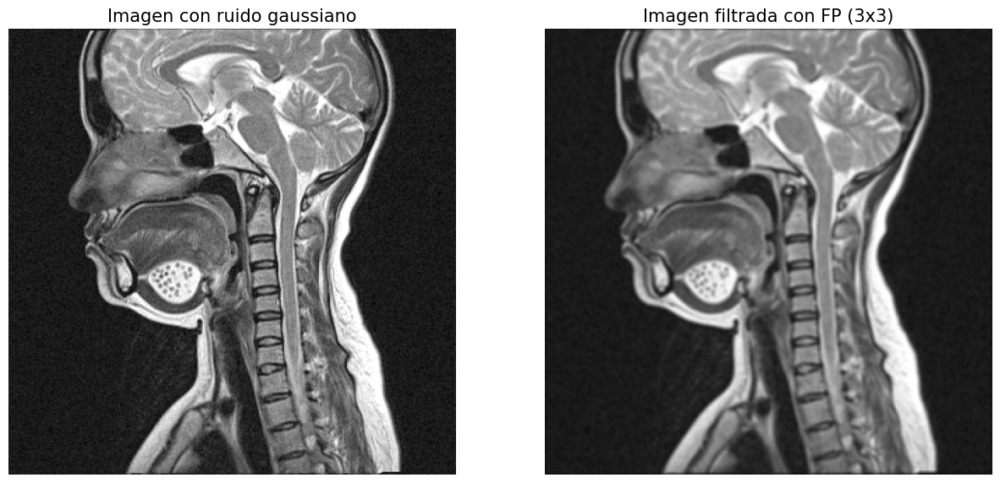

In [37]:
n = 3 
imagen_Gauss_Filtrada_FP = convolucion(img3_ruido_gauss,Kernel_promediador(n))

fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(img3_ruido_gauss, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen con ruido gaussiano",fontsize=15)
ax[0].axis(False)
ax[1].imshow(imagen_Gauss_Filtrada_FP, cmap='gray',vmin=0,vmax=255)
ax[1].set_title("Imagen filtrada con FP (3x3)",fontsize=15)
ax[1].axis(False)
plt.show()

3. Crear una función para construir el algoritmo del Filtro de Mediana

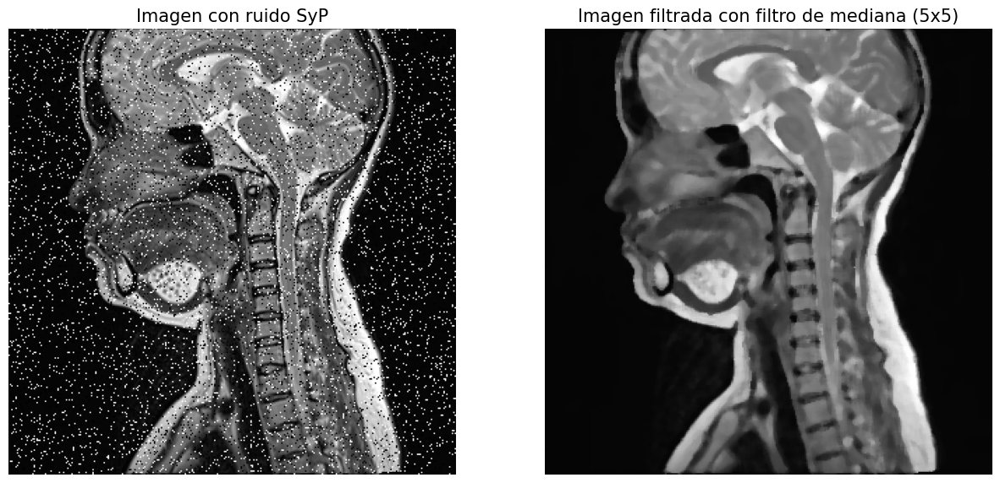

In [38]:
def filtro_mediana(imagen,dimension):
    K_centro = dimension//2
    altura = len(imagen)
    ancho = len(imagen[0])
    resultado = np.zeros((altura,ancho))
    for fila in range(altura):
        for columna in range(ancho):
            valores = []
            for i in range(dimension):
                for j in range(dimension):
                    f = fila + i - K_centro
                    c = columna + j - K_centro
                    if 0 <= f < altura and 0 <= c < ancho:
                        valores.append(imagen[f][c])
                    else:
                        valores.append(0)
            valores = sorted(valores)
            resultado[fila][columna] = valores[(dimension**2)//2]
    return resultado

n=5 #Máscara 5x5
imagen_SyP_filtrada = filtro_mediana(img3_ruido_SyP,n)

fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(img3_ruido_SyP, cmap="gray",vmin=0,vmax=255)
ax[0].set_title("Imagen con ruido SyP",fontsize=15)
ax[0].axis(False)
ax[1].imshow(imagen_SyP_filtrada, cmap='gray',vmin=0,vmax=255)
ax[1].set_title("Imagen filtrada con filtro de mediana (5x5)",fontsize=15)
ax[1].axis(False)
plt.show()

## Detección de bordes

### Kernel Prewitt

In [39]:
#Para bordes verticales
KPV= np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
print(KPV)

[[ 1  0 -1]
 [ 1  0 -1]
 [ 1  0 -1]]


In [40]:
#Para bordes horizontales
KPH= np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
print(KPH)

[[ 1  1  1]
 [ 0  0  0]
 [-1 -1 -1]]


De esta manera se calcula el gradiente en "x" y en "y". Se podría calcular el módulo del gradiente:

In [41]:
#Gx es el resultado de la convolución con KPV
#Gy es el resultado de la convolución con KPH
#G= math.sqrt(Gx** 2 + Gy ** 2)

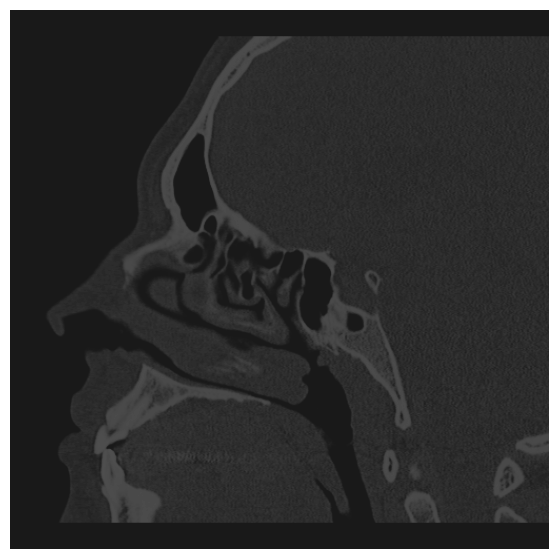

In [42]:
imagen1 = cv2.imread(f'{path}/img25.png',0)

plt.figure(figsize=(7,7))
plt.imshow(imagen1, cmap="gray",vmin=0, vmax=255)
plt.axis('off')
plt.show()

In [43]:
OP_v=cv2.filter2D(imagen1,-1, KPV)  #-1 para indicar que la salida tendrá la misma profundidad que la imagen de entrada.
OP_h=cv2.filter2D(imagen1, -1, KPH)

Bordes_gradiente = np.zeros((OP_h.shape[0],OP_h.shape[1]))

for i in range(Bordes_gradiente.shape[0]):
    for j in range(Bordes_gradiente.shape[1]):
        Bordes_gradiente[i,j] = math.sqrt(OP_v[i,j]**2 + OP_h[i,j]**2)

C:\Users\Juan Bautista\AppData\Local\Temp\ipykernel_648\230299220.py:8: RuntimeWarning: overflow encountered in scalar add
  Bordes_gradiente[i,j] = math.sqrt(OP_v[i,j]**2 + OP_h[i,j]**2)


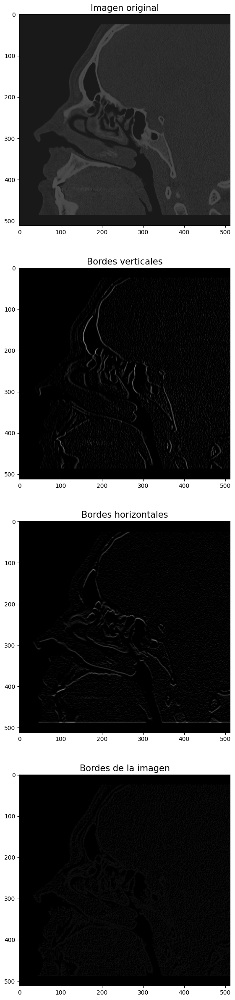

In [44]:
fig,ax = plt.subplots(4,1,figsize=(40,30))

ax[0].imshow(imagen1,vmin=0, vmax=255,cmap='gray')
ax[0].set_title('Imagen original',fontsize=15)
ax[1].imshow(abs(OP_v),vmin=0, vmax=255,cmap='gray')
ax[1].set_title('Bordes verticales',fontsize=15)
ax[2].imshow(abs(OP_h),vmin=0, vmax=255,cmap='gray')
ax[2].set_title('Bordes horizontales',fontsize=15)
ax[3].imshow(abs(Bordes_gradiente),vmin=0, vmax=255,cmap='gray')
ax[3].set_title('Bordes de la imagen',fontsize=15)
plt.show()

### Kernel Sobel

In [45]:
#Para bordes verticales
KSV= np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])
print(KSV)

[[ 1  0 -1]
 [ 2  0 -2]
 [ 1  0 -1]]


In [46]:
#Para Bordes Horizontales
KSH= np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
print(KSH)

[[ 1  2  1]
 [ 0  0  0]
 [-1 -2 -1]]


### Kernel Laplaciano (omnidireccional)

In [47]:
KL1=np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
print(KL1)

[[-1 -1 -1]
 [-1  8 -1]
 [-1 -1 -1]]


In [48]:
KL2=np.array([[0,-1,0],[-1,4,-1],[0,-1,0]])
print(KL2)

[[ 0 -1  0]
 [-1  4 -1]
 [ 0 -1  0]]


In [49]:
L1=cv2.filter2D(imagen1, -1, KL1)
L2=cv2.filter2D(imagen1, -1, KL2)

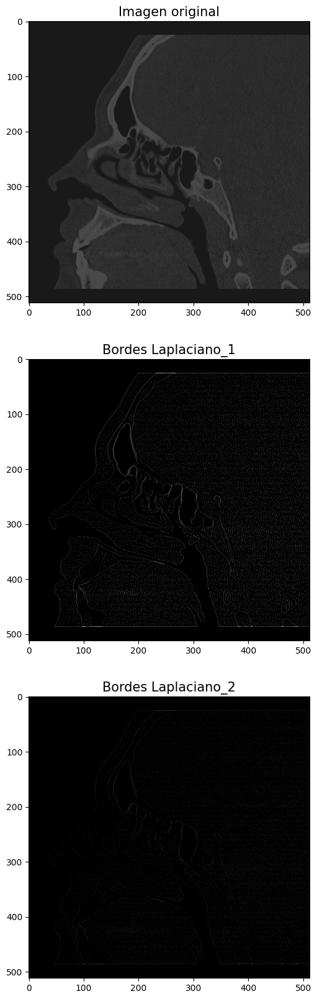

In [50]:
fig,ax = plt.subplots(3,1,figsize=(30,20))

ax[0].imshow(imagen1,vmin=0, vmax=255,cmap='gray')
ax[0].set_title('Imagen original',fontsize=15)
ax[1].imshow(abs(L1),vmin=0, vmax=255,cmap='gray')
ax[1].set_title('Bordes Laplaciano_1',fontsize=15)
ax[2].imshow(abs(L2),vmin=0, vmax=255,cmap='gray')
ax[2].set_title('Bordes Laplaciano_2',fontsize=15)
plt.show()

### Algoritmo de zero crossing

El algoritmo de zero crossing es para obtener una imagen binaria. Consiste en buscar los lugares de la imagen donde su segunda derivada o laplaciano se hacen cero, ya que eso implica un cambio de intensidad y se asume que es un punto de existencia de borde.

Recordar, cuando la primera derivada es máxima, la segunda derivada es cero.

In [51]:
#Paso 1: obtenemos gradiente en x (Gx) con kernel prewitt o sobel
KSV= np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])
#Gx =
#Paso 2: obtenemos gradiente en y (Gy)
#Gy =
#Paso 3: Calculamos el módulo del gradiente. De esa manera obtenemos la primer derivada
#G= math.sqrt(Gx** 2 + Gy ** 2)
#Paso 4: Obtenemos la segunda derivada (de la misma manera que la primera o con kernel omnidireccional)
#KO=np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
#G2 =

La idea del zero crossing es encontrar los cruces por cero en la comparando píxeles de la imagen G2 dentro de la siguiente máscara

Comparo si hay un cambio de signo entre los píxeles    
* a2 y a8
* a4 y a6
* a3 y a7
* a1 y a9  

**Condiciones que se tiene que cumplir en el píxel central para aisgnarle un valor 255 (blanco):**

* Si hay algún cambio de signo entre esos pares de píxeles, definimos que en la posición del píxel central hay un cruce por cero.

* Por otro lado, tomamos el píxel central de la imagen G (primer derivada) y definimos si el valor es mayor que p (umbral).

**Tips:**

* Recorrer la imagen como ya vimos en la clase de Generalidades.
* Defino previamente una matriz de ceros para que sea la imagen de salida.
* A esa matriz voy asignandole el valor 255 a los píxeles que correpondan (se cumplen ambas condiciones).

### Detección con filtro Canny

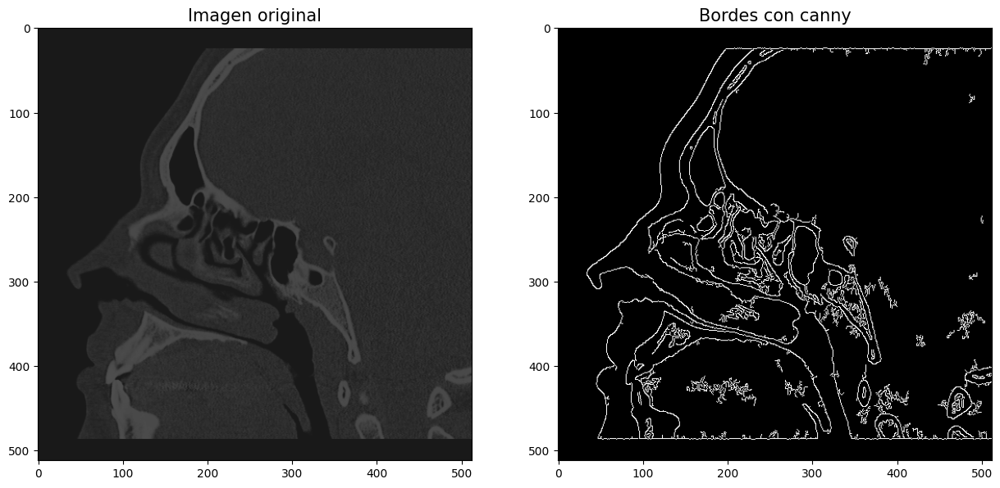

In [52]:
Canny = cv2.Canny(imagen1, 20, 80)
# Los parámetros "20" y "80" son los límites inferior y superior para el umbral de detección de bordes.
# Hay que definir bien los parametros

fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(imagen1,vmin=0, vmax=255,cmap='gray')
ax[0].set_title('Imagen original',fontsize=15)
ax[1].imshow(Canny,vmin=0, vmax=255,cmap='gray')
ax[1].set_title('Bordes con canny',fontsize=15)
plt.show()

In [53]:
# OPCIONAL si quieren codear ustedes mismos el filtro Canny

#Paso 1: Calculamos el gradiente de la imagen con kernel sobel
#G= math.sqrt(Gx** 2 + Gy ** 2)

#Paso 2: Calculamos el ángulo del gradiente
#ang= Arctg (Gy/Gx)
# IMPORTANTE: el valor de ang debe ser entero y valerá 0, 45, 90, 135 según se aproxime mejor a alguna de esas 4 direcciones.
#Obtenemos una nueva imagen de ángulos con esos valores (nos paramos en un píxel y vemos la cercanía con esos 4 ángulos)

**Paso 3**:  **Supresión no máxima** recorremos las imágenes de módulo y ángulo píxel a píxel. Se observa si la magnitud de gradiente del pixel es mas pequeño que al menos uno de sus dos vecinos en la dirección del ángulo calculada. Si eso se cumple se le asigna cero a ese pixel ij, en caso contrario se le asigna el valor de gradiente que tiene. De esa manera nos vamos quedando con píxeles máximos en gradiente.   
Este paso se utiliza para generar una imagen con los bordes adelgazados.

**Paso 4**: para binarizar la imagen se usa el algoritmo de **hitéresis de umbral**. La imagen anterior suele contener máximos locales creados por el ruido.    
Se toma la imagen resultante de aplicar supresión no máxima, las orientaciones(ángulos) y dos umbrales t1 y t2. Donde t1 es menor que t2.    
Recorremos la imagen resultante en un orden fijo y vamos ubicando la posición de todos los píxeles que tienen una intesidad mayor a t2 y guardamos esas posiciones.   
Nos posicionamos en el primer píxel encontrado y le asignamos un 255 a ese y a toda la cadena de píxeles conectados en ambas direcciones perpendiculares a la normal del borde siempre que la intensidad de esos píxeles sean mayor a t1.

Paso 5: obtenemos una imagen binaria con los bordes en blanco, que corresponden a pixeles conectados que son máximos en gradiente.

### Ejercicios

1- Definir Kernel Sobel o Prewitt y luego hacer la convolución su propio algoritmo

In [54]:
K_Sobel_y = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
K_Sobel_x = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
K_S = (K_Sobel_x + K_Sobel_y)
print(K_S)

[[-2 -2  0]
 [-2  0  2]
 [ 0  2  2]]


In [55]:
K_Prewitt_y = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])
K_Prewitt_x = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
K_P = (K_Prewitt_x + K_Prewitt_y)
print(K_P)

[[-2 -1  0]
 [-1  0  1]
 [ 0  1  2]]


In [56]:
FP = convolucion(imagen1,K_P)
FS = convolucion(imagen1,K_S)

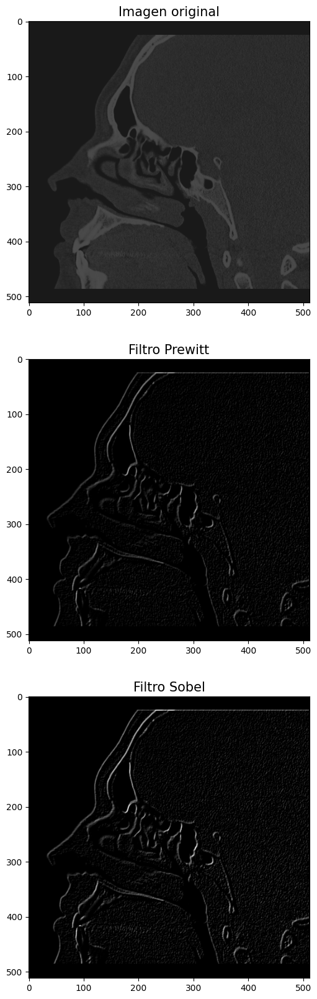

In [57]:

fig,ax = plt.subplots(3,1,figsize=(30,20))
ax[0].imshow(imagen1,vmin=0, vmax=255,cmap='gray')
ax[0].set_title('Imagen original',fontsize=15)
ax[1].imshow(abs(FP),vmin=0, vmax=255,cmap='gray')
ax[1].set_title('Filtro Prewitt',fontsize=15)
ax[2].imshow(abs(FS),vmin=0, vmax=255,cmap='gray')
ax[2].set_title('Filtro Sobel',fontsize=15)
plt.show()

2- Cómo podemos hacer para obtener una imagen en blanco y negro (binaria) de los bordes?
* Miramos el histograma de la imagen de gradiente (resultante de la convolución). Luego definimos un umbral (píxeles mayores al umbral serán 255/blancos y píxeles menores serán cero/negros)

In [58]:
print("Valores mínimos y máximos en FP:", np.min(FP), np.max(imagen1))
print("Valores mínimos y máximos en FS:", np.min(FS), np.max(FS))


Valores mínimos y máximos en FP: 0.0 78
Valores mínimos y máximos en FS: 0.0 252.0


Viendo el valor maximo, vamos a fijar un umbral


In [59]:
def filtro_binario(imagen,umbral):
    ancho = len(imagen[0])
    altura = len(imagen)
    resultado = np.zeros((altura,ancho))
    for i in range(ancho):
        for j in range(altura):
            if imagen[i][j] >= umbral:
                resultado[i][j] = 255
            else:
                resultado[i][j] = 0
    return resultado

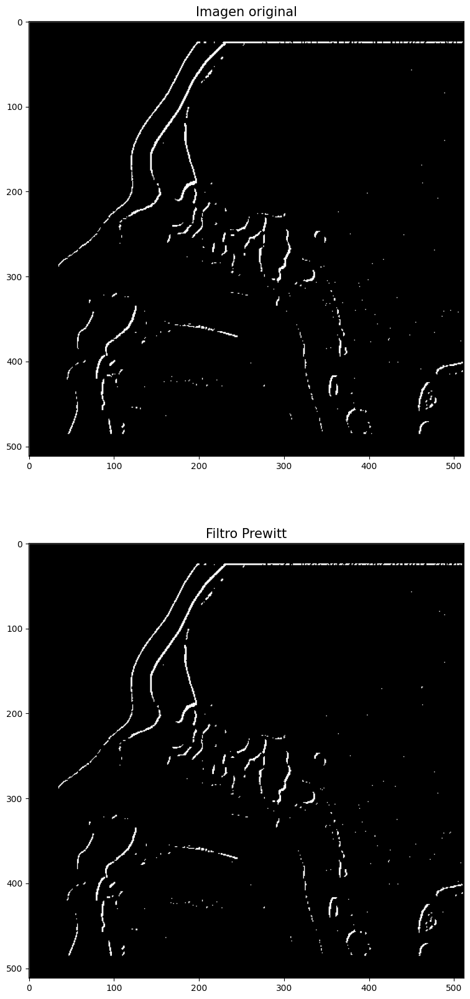

In [60]:

fig,ax = plt.subplots(2,1,figsize=(30,20))
ax[0].imshow(filtro_binario(FP,50),vmin=0, vmax=255,cmap='gray')
ax[0].set_title('Imagen original',fontsize=15)
ax[1].imshow(filtro_binario(FS,70),vmin=0, vmax=255,cmap='gray')
ax[1].set_title('Filtro Prewitt',fontsize=15)
plt.show()

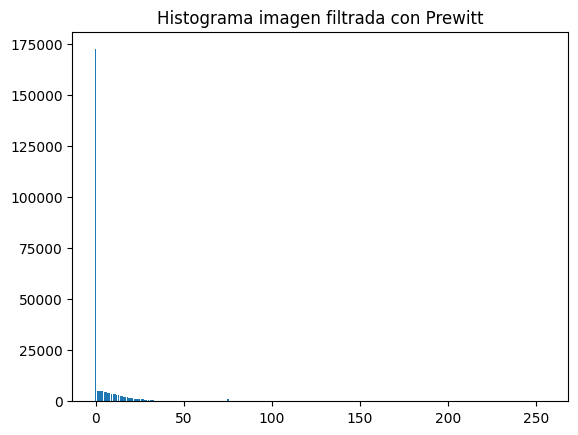

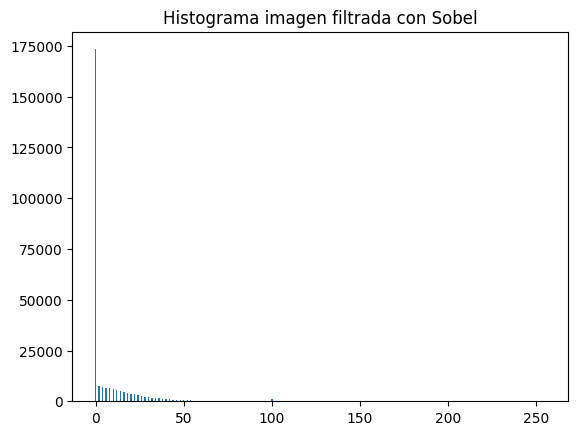

In [61]:
bits = np.arange(0,256)
plt.title('Histograma imagen filtrada con Prewitt')
plt.bar(bits,histograma(FP,True,False))
plt.show()
plt.title('Histograma imagen filtrada con Sobel')
plt.bar(bits,histograma(FS,True,False))
plt.show()

## Transformaciones de intensidad (Parte 2)

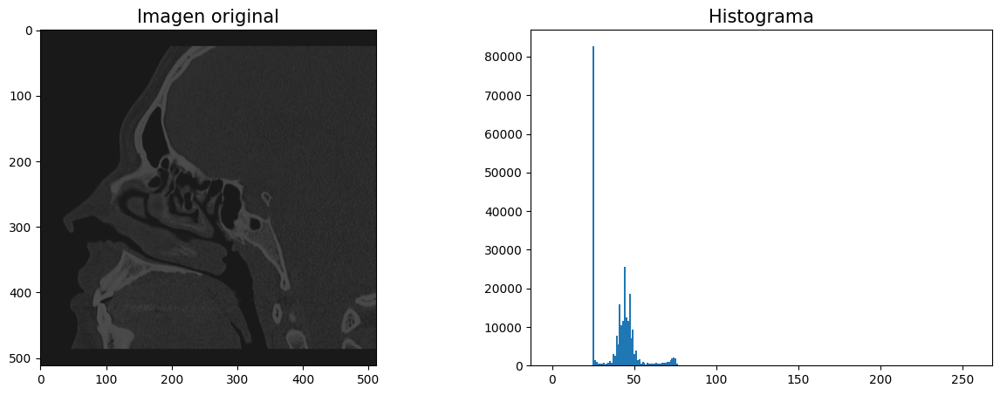

In [62]:
fig,ax = plt.subplots(1,2,figsize=(15,5))
ax[0].imshow(imagen1,vmin=0, vmax=255,cmap='gray')
ax[0].set_title('Imagen original',fontsize=15)
ax[1].hist(np.ravel(imagen1),bins=256, range=(0,255))
ax[1].set_title('Histograma',fontsize=15)
plt.show()

### Ecualización del histograma

In [63]:
imagen1_ec = cv2.equalizeHist(imagen1)

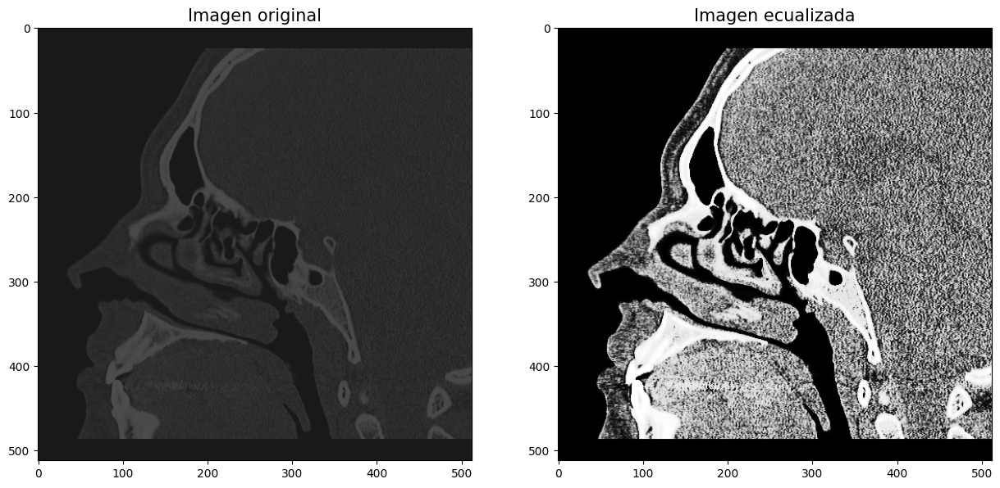

In [64]:
fig,ax = plt.subplots(1,2,figsize=(15,20))
ax[0].imshow(imagen1,vmin=0, vmax=255,cmap='gray')
ax[0].set_title('Imagen original',fontsize=15)
ax[1].imshow(imagen1_ec,vmin=0, vmax=255,cmap='gray')
ax[1].set_title('Imagen ecualizada',fontsize=15)
plt.show()

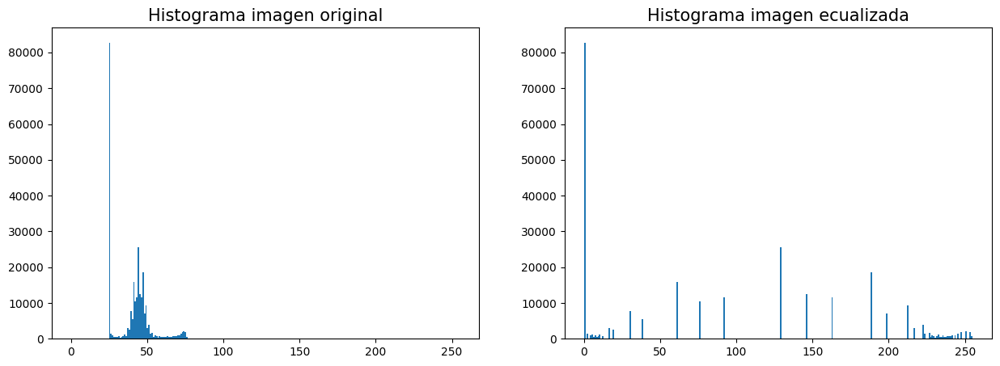

In [65]:
fig,ax = plt.subplots(1,2,figsize=(15,5))
ax[0].hist(np.ravel(imagen1),bins=256, range=(0,255))
ax[0].set_title('Histograma imagen original',fontsize=15)
ax[1].hist(np.ravel(imagen1_ec),bins=256, range=(0,255))
ax[1].set_title('Histograma imagen ecualizada',fontsize=15)
plt.show()

Pretende obtener un histograma uniforme para la imagen modificada. Todos los píxeles de un mismo nivel de gris tendrán otro nivel de intensidad. El histograma se va a distribuir en todo el rango disponible separando en lo posible las ocupaciones de cada nivel. Se utilza para realzar el contraste entre nivel y nivel.

$g(m,n)= p. H(f(m,n))$

donde $g(m,n)$ es la imagen resultante, $f(m,n)$ la imagen original, $p$ es la intensidad máxima, $H$ es la función de densidad de los valores de intensidad de la imagen original.

Para qué nos sirve el histograma acumulado?

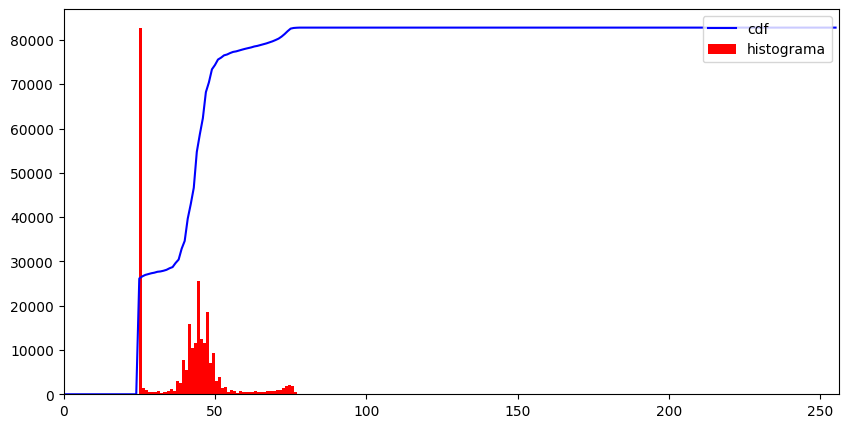

In [66]:
#Genera el historama de la imagen
hist_1,bins_1 = np.histogram(imagen1.flatten(),256,[0,256])

#Genera la función de distribución acumulada
cdf = hist_1.cumsum()
cdf_normalized = cdf *hist_1.max() / cdf.max()

plt.figure(figsize=(10,5))
plt.plot(cdf_normalized, color = 'b')
plt.hist(imagen1.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histograma'), loc = 'upper right')
plt.show()

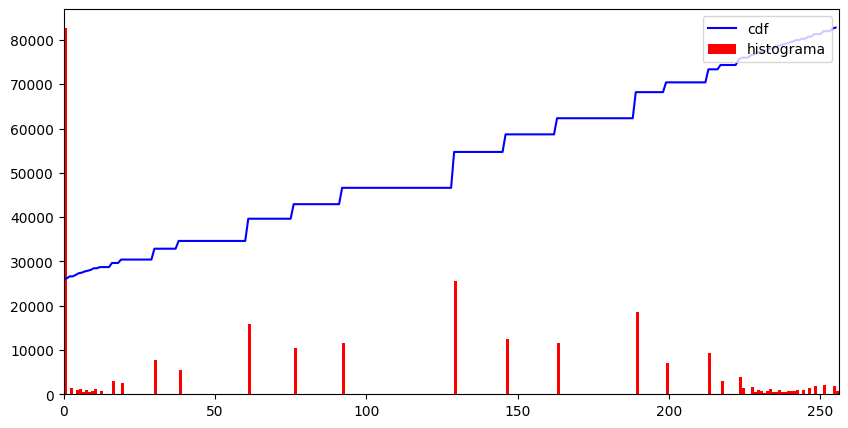

In [67]:
hist_ec,bins_ec = np.histogram(imagen1_ec.flatten(),256,[0,256])

cdf = hist_ec.cumsum()
cdf_normalized = cdf * hist_ec.max()/ cdf.max()

plt.figure(figsize=(10,5))
plt.plot(cdf_normalized, color = 'b')
plt.hist(imagen1_ec.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histograma'), loc = 'upper right')
plt.show()

### Ecualización local del histograma

Ecualizamos el histograma de la misma manera que antes, pero esta vez por porciones de la imagen. Esas porciones las obtenemos según la dimensión que tiene la máscara (en este caso la máscara va a tener el mismo uso que en el filtro de mediana, solamente tomar esa porción de la imagen)

### Escalado de intensidad


Consiste en tomar un rango de intensidades [f1,f2] que se busca escalar como máximo a una fmax.
Este método se utiliza para extraer un tipo de tejido de la imagen y separarlo del resto.

Si f está incluído en [f1,f2]:                         

$g = ((f-f1)/(f2-f1))*fmax$;                               
$g = 0$ en caso contrario

$fmax$ puede tomar el valor de intensidad máxima (ejem 255).

Notese que los píxeles que no tengan una intensidad f dentro del rango [f1,f2] van a tener todos el mismo valor.

### Ejercicios

1. Completar algoritmo de ecualización del histograma.

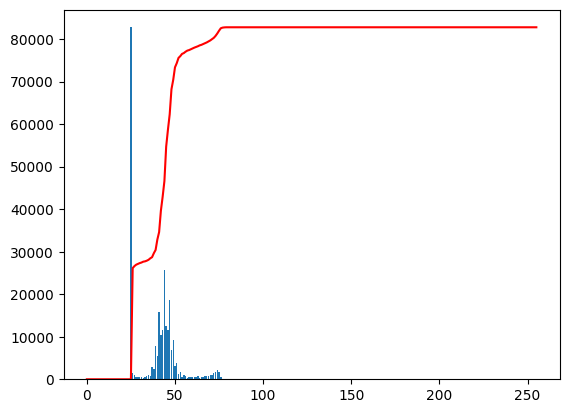

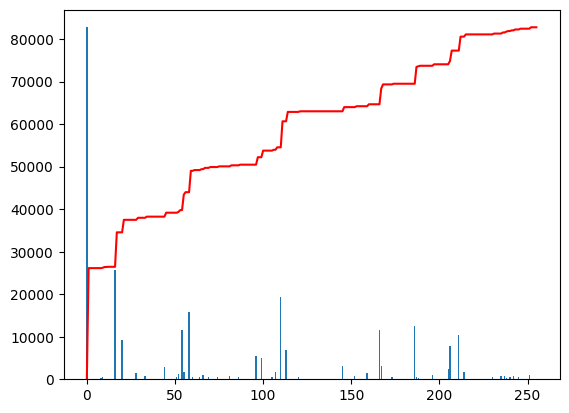

In [68]:
#Paso 1: Caulculamos el histograma con su propio codigo
hist =histograma(img1,True,False)
acum= np.zeros(256)
bits = np.arange(0,256)
plt.bar(bits,hist)
#Paso 2: Obtenemos el histograma acumulado (H.cum)
for i in bits:
    acum[i]= sum(hist[0:i])
acum = acum*max(hist)/max(acum)
plt.plot(bits,acum,'r')
plt.show()
#Paso 3: Calculo el mínimo nivel de gris de la imagen (n.min)
# np.min(imagen) --> 25
# n.min = ... (valor escalar) en este caso 25
# significa que en el histograma acumulado voy a tener muchos 0 al principio hasta el elemento ubicado en la posición 25 del vector H.
min = np.min(hist)
#Paso 4: Recorro la imagen pixel a pixel (en cada iteración veo el nivel de gris del pixel i,j).
# Le llamamos "n" al nivel de gris de ese pixel y "n.new" al nuevo nivel de gris de ese pixel.
# "p" es el valor máx del rango (en este caso sería 255)
imagen_ecualizada = np.zeros_like(img1)
for i in range(len(img1)):
    for j in range(len(img1[0])):
        n = img1[i, j]
        n_new = acum[n]
        imagen_ecualizada[i, j] = n_new
hist =histograma(imagen_ecualizada,True,False)
acum= np.zeros(256)
bits = np.arange(0,256)
plt.bar(bits,hist)
for i in bits:
    acum[i]= sum(hist[0:i])
acum = acum*max(hist)/max(acum)
plt.plot(bits,acum,'r')

$n.new = \frac{(H.cum(n)-H.cum(n.min))*p}{(H.cum(p)-H.cum(n.min))}$

2. Completar algoritmo de ecualización local del histograma.

In [69]:
#Paso 1: Hacemos zeropadding a la imagen de entrada
#Paso 2: Recorrer la imagen de la misma manera que con el filtro de mediana

#Paso 3: Calcular el histograma en esa porción (el histograma va de 0 a 255)

#Paso 4: Normalizamos el histograma acumulado con la cantidad de píxeles que tiene esa porción de la imagen

#Paso 5: Nos fijamos el valor del histograma acumulado normalizado que tiene el nivel de gris i correspondiente al nivel de gris del píxel central

#Paso 6: Aplicamos la fórmula y luego ubicamos el resultado en la posición del píxel central

#Paso 7: Nos movemos un lugar con la máscara

3. Realizar algoritmo de escalado de intensidad.